# Test area for diffusion modelling.

## Plan

* Research how an egg solidifies
    - Get data on parameters
* Get heat transfer finite difference model working
* Create functions to generate mesh for use in model
    - Diffusion coefficient grid
* Get boundary conditions to follow curve / LuT input
* Show egg related diffusion in a standard test 
    - Average egg size following 'standard' cooking conditions
* Tolerance interval / correlation on input conditions
    - Average cooking conditions for perfect egg
    - Most sensitive parameter
    - How to maximise your changes of making the perfect egg



# Ajitsuke Tamago - The art of boiling eggs

Ajitsuke Tamago, aka __Ramen eggs__, are one of my favorite additions to a hearty ramen bowl. These eggs have a thick treacly yoke with a soft custard like white that has been marinated. The hardest part of making these eggs is the cooking to get the right egg consistencies.

The goal of this investigation is to look model the cooking step of making Ajitsuke Tamago eggs and get an understanding of most sensitive parameter that need to be controlled to get a repeatable product.

## The chemistry of eggs

There are many publications on eggs, their chemistry and even modelling the boiling of eggs <sup>1, 2</sup>. In summary, the composition and transformation of cooking an egg is as follows:

Based on Hen eggs, the main areas of an egg consists of 3 key parts:

1. **Shell** - This is a porous structure mainly consisting of calcium carbonate and it accounts of 12% of an eggs mass.
2. **White** (albumen) - Multi-layered opalescent substance mainly consisting of 2 proteins (12% ovotransferrin, 54% ovalbumin). It accounts for 67% of the egg's mass.
3. **Yoke** - Contains fats, vitamins and < 50% of the egg's protein. It accounts for 33% of the egg's mass.

Other parts:
* **Inner and outer membrane** between shell and albumen.
* **Chalazae** - anchors the yoke in the centre of the egg.
* **Vitelline membrane** - between the yolk and albumen.
* **Air cell** - Generally forms at the larger end of the egg between the inner and outer membranes. It forms when the egg contracts after being laid.

### How the parts of an egg cook (or not)

The phase change of an egg (yolk and white) is due to a coagulation of denatured proteins within the egg. The proteins denature at different temperature ranges, aggregate and form gel like structures. Note: Proteins can also be denatured by other mechanisms (i.e. pH changes, mechanical action) but these are out-of-scope of this investigation. 

The phase changes of an egg are summarized in the below table (based on ref <sup>3</sup>):

| Temperature (°C) | White | Yolk |
| :--------------: | :---- | :--- |
| < 55 | WARNING | Salmonella :) |
| 63 | Partially set | Runny thickening |
| 65 - 70 | Soft set gel | Runny treacle |
| 73 | Largely set | Soft gel |
| 77 | Tender solid | Hard boiled |
| 80 | Firm | Onset green discoloration |
| 90 | Over cooked | Dry, crumbly solid |


___
[1]: https://www.sciencedirect.com/science/article/pii/S2665927124001989 - Modeling of cooking and phase change of egg white using computational fluid dynamics. R E. Sánchez-García et al. 2024

[2]: https://www.nature.com/articles/s44172-024-00334-w - Periodic cooking of eggs. E D. Lorenzo et al. 2025

[3]: https://math.arizona.edu/~gabitov/teaching/141/math_485/Final_Presentations/Cooking_Final_Presentation.pdf - Numerical Modeling of Diffusion and Phase Transitions in Heterogeneous Media. H. Jeffrey. 

[4]: https://khymos.org/2009/04/09/towards-the-perfect-soft-boiled-egg/ - Towards the perfect soft boiled egg, M. Lersch. 2009

## Modelling egg boiling

To model the cooking of an egg, a general diffusion model was implemented to simulate the heat transfer in the system. A 2D diffusion type system in has the general form of:
$$
    \frac{\delta u}{\delta t} = \alpha (\frac{\delta^2 u}{\delta x^2} + \frac{\delta^2 u}{\delta y^2}) 
$$
where $u(x,y,t)$ is the function to be solved, $x$ and $y$ are  cartesian coordinates and t is time. $\alpha$ is the diffustion coefficient and determines the rate change in $u$ in $t$.

Based on finite differences (see appendix for detailed notes), this can be expressed as:
$$ 
    u_i^{n+1} = u_{i,j}^n + F_x(u_{i+1,j}^n - 2u_{i,j}^n + u_{i-1,j}^n) + F_y(u_{i,j+1}^n - 2u_{i,j}^n + u_{i,j-1}^n)
$$
where
$$
    F_x = \alpha \frac{\Delta t}{\Delta x^2}, F_y = \alpha \frac{\Delta t}{\Delta y^2}
$$
> [!Note]
> $F$ is the __Fourier Number__, a dimensionless value that represents the physical parameters of the diffusion problem in $\alpha$ and the discretized parameters $\Delta x$ and $\Delta t$.

Note the time domain is defined as:
$$
    t_n = n \Delta t, n = 0,...,N_t
$$
with the space domain as:
$$
    x_i = i\Delta x, i = 0,...,N_x, 
$$
$$
    y_j = j\Delta y, j = 0,...,N_y
$$

### Variable diffusion coefficient

As mentioned in the above, the properties of the egg (white & yolk) change with temperature, this including their effective thermal diffusion coefficient. 

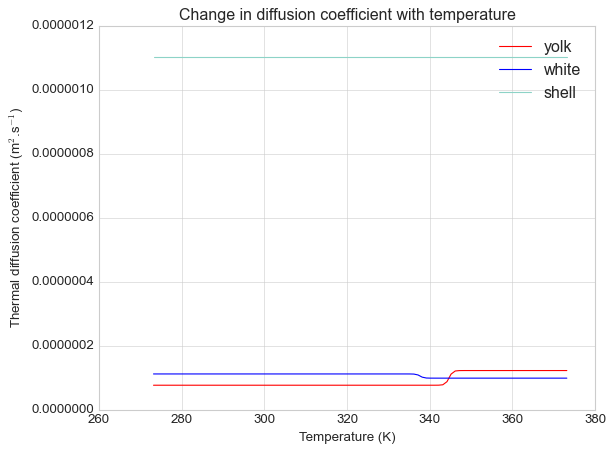

In [59]:
# Modelling thermal coefficient as function of temperature (coagulation)
import numpy as np
import matplotlib.pyplot as plt

def thermal_diffusion(conductivity, density, capacity):
    """Return thermal diffusion coefficient

    Args:
        conductivity (float): thermal conductivity (k, W m-1 K-1)
        density (float): density ('rho', kg m-3) 
        capacity (float): heat capacity (c, J kg-1 K-1)

    Returns:
        float: thermal diffusion ('alpha', m2 / s)
    """
    return conductivity / (density * capacity)

def logistic(L, k, x, x0, y0):
    """Return logistic data

    Args:
        L (float): supremum (end value)
        k (float): growth rate (logistic)
        x (array, float): x value(s)
        x0 (float): mid-point
        y0 (float): y intercept
    """
    return (L - y0) / (1 + np.exp(-k*(x - x0))) + y0

# Data from https://www.sciencedirect.com/science/article/pii/S2665927124001989

yolk = {
    "density": [1100, 1032],        # kg m-3, [liquid, solid]
    "conductivity": [0.31, 0.34],   # W m-1 K-1
    "capacity": [3700, 2700],       # J kg-1 K-1
    "chang_T": 343.15,              # K
    "interval_K": 3,                # K
    "latent":12.2                   # KJ kg-1
}

white = {
    "density": [1134, 1100],        # kg m-3, [liquid, solid]
    "conductivity": [0.48, 0.40],   # W m-1 K-1
    "capacity": [3800, 3700],       # J kg-1 K-1
    "chang_T": 336.15,              # K
    "interval_K": 3,                # K
    "latent":12.2                   # KJ kg-1
}

shell = {
    "density": [2300, 2300],        # kg m-3, [solid, solid] <- this is N/A
    "conductivity": [2.25, 2.25],   # W m-1 K-1
    "capacity": [888, 888],         # J kg-1 K-1
    "chang_T": 1,                   # K <- N/A
    "interval_K": 1,                # K <- N/A
    "latent": 0                     # KJ kg-1 <- N/A
}

yolk["diffusion"] = [thermal_diffusion(yolk["conductivity"][0], yolk["density"][0], yolk["capacity"][0])]
yolk["diffusion"].append(thermal_diffusion(yolk["conductivity"][1], yolk["density"][1], yolk["capacity"][1]))
white["diffusion"] = [thermal_diffusion(white["conductivity"][0], white["density"][0], white["capacity"][0])]
white["diffusion"].append(thermal_diffusion(white["conductivity"][1], white["density"][1], white["capacity"][1]))
shell["diffusion"] = [thermal_diffusion(shell["conductivity"][0], shell["density"][0], shell["capacity"][0])]
shell["diffusion"].append(thermal_diffusion(shell["conductivity"][1], shell["density"][1], shell["capacity"][1]))

# Plot diffusion coefficeint vs temperature, assume sigmodal change in coefficient
T =  np.linspace(273.15, 273.15 + 100, 101)

# Assume a logistic change (fairly linear), with curve width (3K) fitting the 0.1% to 99.9% window
yolk_diffusion = logistic(yolk["diffusion"][1], np.log(0.999/0.001) / yolk["interval_K"], T, yolk["chang_T"] + yolk["interval_K"]/2, yolk["diffusion"][0])
white_diffusion = logistic(white["diffusion"][1], np.log(0.999/0.001) / white["interval_K"], T, white["chang_T"] + white["interval_K"]/2, white["diffusion"][0])
shell_diffusion = logistic(shell["diffusion"][1], np.log(0.999/0.001) / shell["interval_K"], T, shell["chang_T"] + shell["interval_K"]/2, shell["diffusion"][0])

fig, ax = plt.subplots()
ax.plot(T, yolk_diffusion, label="yolk", color='red')
ax.plot(T, white_diffusion, label="white", color='blue')
plt.plot(T, shell_diffusion, label="shell")
ax.legend()
ax.set_title("Change in diffusion coefficient with temperature")
ax.set_xlabel("Temperature (K)")
ax.set_ylabel("Thermal diffusion coefficient (m$^2$.s$^{-1}$)")

plt.style.use('seaborn-v0_8-whitegrid')
plt.show()



The above plot shows how the diffusion coefficient changes as temperature increases. It can be noted that:

* The shell had a constant thermal diffusion coefficient
* The white's thermal diffusion coefficient decreases at the 63℃ transition temperature
    - Note: This is assumed to be the transition due to the denaturing of the ovotransferrin protein as the later denaturing is not until 80℃.
    - Therefore further change in diffusion coefficient > 80℃ are not covered in the data for this model.
* The yolk's thermal diffusion coefficient increases at the 70℃ transition temperature.

## Modelling Mesh

The standard mesh for a finite difference problem is a cartesian grid. Although there is the option to make more complex or dynamic meshes, if this is needed to capture the detail in an simulation then an FEA approach is probably more desirable. However, if we assume that the relatively high diffusion coefficient (≈ x10 greater than yolk and white) and a thickness of ≈0.3 mm of the shell has little its influence on the overall heat transfer, it can be ignored. So, the overall model consists of 2 parts: the white and the yolk.

### Egg shape

The shape of the egg based on the model from Lian et al [<sup>5</sup>], where the parametric form is:
$$
    y_p=asin\theta
$$
$$
    x_p=bcos\theta(1+c_1sin\theta+c_2sin^2\theta+c_3sin^3\theta)
$$
where $y_p$ & $x_p$ are the coordinates of the egg profile (2D); $\theta$ is the eccentric angle; $a$ the half length; $b$ approximate half width; $c_1,c_2,c_3$ are parameters to be adjusted to fit an egg shape.

___
[5]: https://www.sciencedirect.com/science/article/pii/S0032579124006485 - Comparison of egg-shape equations using relative curvature measures of nonlinearity. M. Lain et al. 2024

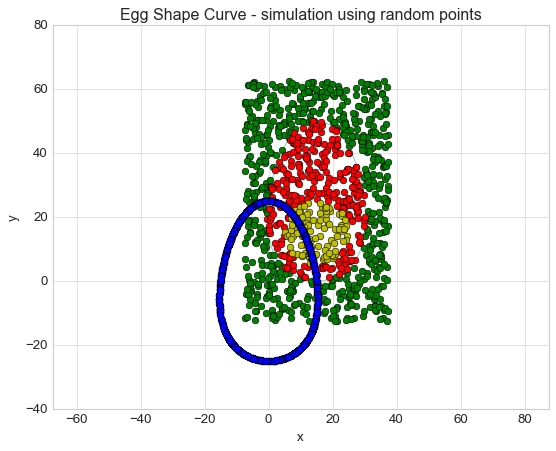

In [ ]:
# Egg shape curve
# A parametric equation to generate an egg shape curve
# Reference: Comparison of egg-shape equations using relative curvature measures of nonlinearity, Lian et al., 2024

import numpy as np
import matplotlib.pyplot as plt

def egg_shape(half_width, half_height, t, c1, c2, c3 , x_axis_offset=0, y_axis_offset=0):
    x = (half_width * np.cos(t)) * (1 + c1*np.sin(t) + c2*np.sin(t)**2 + c3*np.sin(t)**3) + x_axis_offset
    y = half_height * np.sin(t) + y_axis_offset
    return x, y

def find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , t, x_axis_offset, y_axis_offset):
    egg_x, egg_y = egg_shape(half_width, half_height, t, c1, c2, c3, 0, 0)
    err = np.atan2(point_y - y_axis_offset, point_x - x_axis_offset) - np.atan2(egg_y, egg_x)
    # print("point: %f, %f - egg: %f, %f - err:, %f - theta: %f, %f"%(point_x, point_y, egg_x, egg_y, err, t, np.atan2(egg_y, egg_x)))
    # print("theta guess: ", np.atan2(point_y - y_axis_offset, point_x - x_axis_offset))
    return err, egg_x, egg_y

def find_theta_of_egg(point_x, point_y, half_width, half_height, c1 , c2 , c3 , x_axis_offset, y_axis_offset):
    # Bisection method t = theta = atan2(y, x)
    a = 0
    b = np.pi 
    err_a = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , a, x_axis_offset, y_axis_offset)[0]
    err_b = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , b, x_axis_offset, y_axis_offset)[0]
    
    if np.sign(err_a)  == np.sign(err_b):
        # print("err_a: ", err_a, "a: ", a, "err_b: ", err_b, "b: ", b)
        b = -np.pi
        err_b = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , b, x_axis_offset, y_axis_offset)[0]
        if np.sign(err_a)  == np.sign(err_b):
                # print("err_a: ", err_a, "a: ", a, "err_b: ", err_b, "b: ", b)
                raise Exception("Bisection method requires a sign change over the interval.")
    
    count = 0
    while True:
        m = (a + b) / 2
        err_m, egg_x, egg_y = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , m, x_axis_offset, y_axis_offset)

        if np.abs(err_m) < 1e-14:
            # print("Converged in ", count, " iterations with error ", err_m)
            return m, egg_x, egg_y
        elif np.sign(err_a) == np.sign(err_m):
            a = m
            err_a = err_m
        else:
            b = m
            err_b = err_m
        
        count += 1
        if count >= 1000:
            print("Error: ", err_m)
            raise Exception("Bisection method did not converge within 1000 iterations.")

def point_within_egg(point_x, point_y, half_width, half_height, c1 , c2 , c3 , x_axis_offset, y_axis_offset):

    # Find a theta of the egg shape that matches the theta of the point
    egg_theta, egg_x, egg_y = find_theta_of_egg(point_x=point_x, point_y=point_y, half_width=half_width, half_height=half_height,
                                                c1=c1, c2=c2, c3=c3, x_axis_offset=x_axis_offset, y_axis_offset=y_axis_offset)
    # Get egg shape X, Y that intersects egg_theta
    # egg_x, egg_y = egg_shape(half_width, half_height, egg_theta, c1=c1, c2=c2, c3=c3, x_axis_offset=0, y_axis_offset=0)
    # egg_x, egg_y = egg_shape(half_width, half_height, egg_theta, c1, c2, c3, 0, 0)
    # print("theta point: ", np.atan2(point_y - y_axis_offset, point_x - x_axis_offset), ", theta of egg_cor: ", np.atan2(egg_y, egg_x), ", theta: ", egg_theta)
    # print("egg x,y: ", egg_x, ", ", egg_y, " theta: ", np.atan2(egg_y, egg_x), " theta cor: ", egg_theta)

    # Return if point is within egg shape
    return ((point_x - x_axis_offset)**2 + (point_y - y_axis_offset)**2) <= (egg_x**2 + egg_y**2), egg_x, egg_y


def yoke_shape(x_axis_offset, y_axis_offset, a, b, t):
    x = x_axis_offset + a*np.cos(t)
    y = y_axis_offset + b*np.sin(t)
    return x, y

###
#
# Testing egg shape functions and allocation of points

t = np.linspace(0, 2*np.pi, 100)
# Egg parameters
width = 15
height = 25
c1 = -0.2
c2 = 0.1
c3 = 0.0
x_shift = width
y_shift = height
# Yoke parameters
a = 10
b = 10
x_shift_yoke = x_shift
y_shift_yoke = y_shift - 10

x, y = egg_shape(width, height, t, c1=c1, c2=c2, c3=c3, x_axis_offset=x_shift, y_axis_offset=y_shift)
x_yoke, y_yoke = yoke_shape(x_shift_yoke, y_shift_yoke, a, b, t)

x_test = np.random.rand(1000) * width * 3 - 0.5 * width
y_test = np.random.rand(1000) * height * 3 - 0.5 * height

# x_test = np.ones(1) * 5
# y_test = np.ones(1) * 5

point_in_egg = np.zeros_like(x_test, dtype=bool)
point_in_york = np.zeros_like(x_test, dtype=bool)
x_egg_chk = np.zeros_like(x_test)
y_egg_chk = np.zeros_like(x_test)
for i in range(len(x_test)):
    point_in_egg[i], x_egg_chk[i], y_egg_chk[i] = point_within_egg(x_test[i], y_test[i], width, height, 
                                       c1 , c2 , c3 , 
                                       x_shift, y_shift)
    # Need to fix this for an ellipse not circle
    point_in_york[i] = ((x_test[i] - x_shift_yoke)**2 + (y_test[i] - y_shift_yoke)**2)**0.5 <= (a)
    
plt.plot(x, y)
plt.plot(x_yoke, y_yoke)
plt.plot(x_test[np.where(np.invert(point_in_egg))], y_test[np.where(np.invert(point_in_egg))], 'go')  # Plot test points
plt.plot(x_test[np.where(point_in_egg != point_in_york)], y_test[np.where(point_in_egg != point_in_york)], 'ro')  # Plot test points
plt.plot(x_test[np.where(point_in_york)], y_test[np.where(point_in_york)], 'yo')  # Plot test points
plt.plot(x_egg_chk, y_egg_chk, 'bo')  # Plot test points
plt.title('Egg Shape Curve - simulation using random points')
plt.xlabel('x')
plt.ylabel('y')
plt.axis('equal')
plt.style.use('seaborn-v0_8-whitegrid')
plt.show()


The above plot shows the egg shape using fictional parameters to simulate an egg. The point in the plot are randomly generated and color-assigned depending on where are in the egg. This approach will be used to generate the mesh and thermal diffusion coefficient array for the modelling.

### Define thermal diffusion coefficient array

...            jupyter nbconvert 'Test notebook.ipynb' --to html --no-input


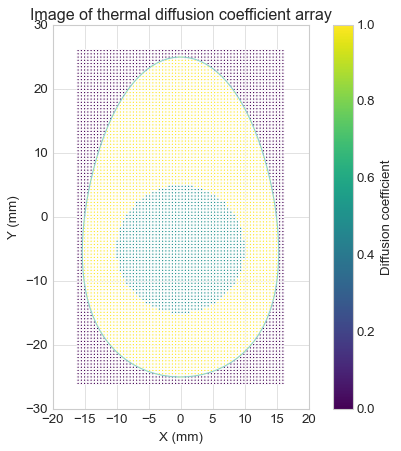

In [68]:
import math
import numpy as np

def round_up_to_nearest_odd(value):
    round_up_value = math.ceil(value)
    if round_up_value % 2 == 0:
        return int(round_up_value +1)
    else:
        return int(round_up_value)
    
# Make diffusion grid

# Model definition
egg_width = 30      # mm
egg_height = 50     # mm
egg_c1 = -0.2       # Shape parameter 1st order
egg_c2 = 0.1        # Shape parameter 2nd order
egg_c3 = 0.0        # Shape parameter 3rd order
white_alpha = 1     # Egg white coefficient of diffusion
yoke_width = 20     # mm
yoke_height = yoke_width    # mm, assume round for now - can implement ellipse later if needed
yoke_center = -5    # mm, height from base off egg
yoke_alpha  = 0.5   # Egg yoke coefficient of diffusion

# Mesh definition
dx = 0.5     # mm per node
dy = dx
# # mesh_width: odd value puts line of node at line of symmetry, +1 is for boundary conditions at 0 & n
# mesh_width = round_up_to_nearest_odd(egg_width / dx + 1)   
# mesh_height = round_up_to_nearest_odd(egg_height / dy + 1)

mesh_X_mm = np.linspace(-egg_width/2 - 1, egg_width/2 + 1, int(np.ceil((egg_width + 2)/dx)))
mesh_Y_mm = np.linspace(-egg_height/2 - 1, egg_height/2 + 1, int(np.ceil((egg_height + 2)/dx)))

# mesh_X_mm = np.linspace(-egg_width/2 - 1, egg_width/2 + 1, (egg_width + 2)*dx)
# mesh_Y_mm = np.linspace(-egg_height/2 - 1, egg_height/2 + 1, (egg_width + 2)*dy)

# Diffusion grid
X, Y = np.meshgrid(mesh_X_mm, mesh_Y_mm)
alpha_grid = np.zeros_like(X)

for y in range(np.size(alpha_grid,0 )):
    for x in range(np.size(alpha_grid, 1)):
        # Check if point in yoke
        point_in_yoke = (X[y, x]**2 + (Y[y, x] - yoke_center)**2) <= (yoke_width/2)**2
        if point_in_yoke:
            alpha_grid[y, x] = yoke_alpha
        else:
            # Check if point in white
            point_in_egg, e1, e2 = point_within_egg(X[y, x], Y[y, x], egg_width/2, egg_height/2,
                                                    egg_c1, egg_c2, egg_c3, 
                                                    0, 0)
            if point_in_egg:
                alpha_grid[y, x] = white_alpha

x, y = egg_shape(egg_width/2, egg_height/2,
                 np.linspace(0, 2*np.pi, 100),
                 egg_c1, egg_c2, egg_c3,
                 0, 0)

fig, ax = plt.subplots()
ax.set_aspect('equal')
scatter = ax.scatter(X, Y, c=alpha_grid, cmap='viridis', s=5)
fig.colorbar(scatter, ax=ax, label='Diffusion coefficient')
ax.plot(x, y)
ax.set_title('Image of thermal diffusion coefficient array')
ax.set_xlabel('X (mm)')
ax.set_ylabel('Y (mm)')
plt.show()



## Simulation

...

In [70]:
""""
Function for solving diffusion system in 2D using finite difference method.

This function has the addition of:
 - Variable alpha values for diffusion coefficient
"""
import numpy as np

def solve_diffusion_2d_vAlpha(nx, ny, dx, dy, dt, nt, alpha, u0):
    """
    Solve the 2D diffusion equation using finite difference method.

    Parameters:
    nx : int
        Number of grid points in x direction.
    ny : int
        Number of grid points in y direction.
    dx : float
        Grid spacing in x direction.
    dy : float
        Grid spacing in y direction.
    dt : float
        Time step size.
    nt : int
        Number of time steps to simulate.
    alpha : 2D array
        Diffusion coefficient.
    u0 : 2D array
        Initial condition for the diffusion equation.

    Returns:
    u : 3D array (t, x, y)
        All solutions from t = 0 to nt time steps.
    """
    # Check stability condition - using max alpha for worst case
    if dt > (dx**2 * dy**2) / (2 * alpha.max() * (dx**2 + dy**2)):
        dt_max = (dx**2 * dy**2) / (2 * alpha.max() * (dx**2 + dy**2))
        alpha_max = (dx**2 * dy**2) / (2 * dt * (dx**2 + dy**2))
        raise ValueError("Time step size dt is too large for stability. Maximum dt: ", dt_max, " or reduce alpha to: ", alpha_max)
    
    u = np.zeros((nt, nx, ny))  # Initialize the solution array
    u[0, :, :] = u0  # Set initial condition
    for n in range(1, nt):
        # Reset boundary conditions at each time step
        u[n, 0, :] = u0[0, :]       # Left boundary
        u[n, -1, :] = u0[-1, :]     # Right boundary
        u[n, :, 0] = u0[:, 0]       # Bottom boundary
        u[n, :, -1] = u0[:, -1]     # Top boundary  
        # Iterate over internal grid points
        for i in range(1, nx-1):    
            for j in range(1, ny-1):
                u[n, i, j] = (u[n-1, i, j] + 
                               alpha[i, j] * dt * ((u[n-1, i+1, j] - 2*u[n-1, i, j] + u[n-1, i-1, j]) / dx**2 +
                                              (u[n-1, i, j+1] - 2*u[n-1, i, j] + u[n-1, i, j-1]) / dy**2))
    return u

Elapsed time for solution: 3.05 seconds


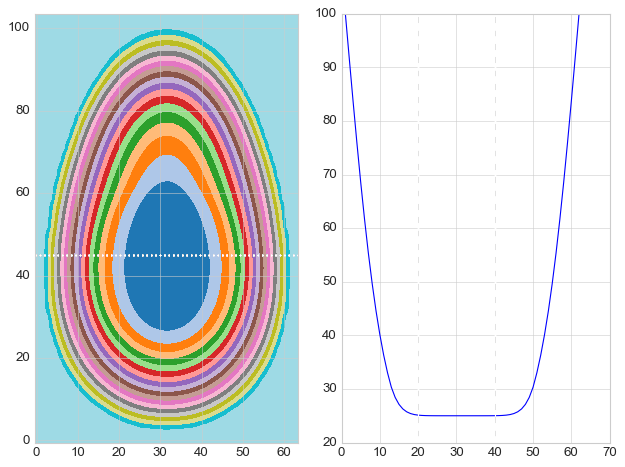

In [71]:
# Test alpha_grid

import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.cm as cm
import time as time
from IPython.display import HTML
import numpy as np

initial_condition = np.ones_like(alpha_grid) * 25   # All start at 25 degrees
initial_condition[np.where(alpha_grid == 0)] = 100

start_time = time.time()
test = solve_diffusion_2d_vAlpha(np.size(alpha_grid, 1), np.size(alpha_grid, 0), 
                                 dx, dy, 0.0625, 300, alpha_grid.T, initial_condition.T)
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time for solution: {elapsed_time:.2f} seconds")

fig, (ax1, ax2) = plt.subplots(1, 2)
images = []

for i in range(100):
    ax1.axhline(45, linestyle=':', label='test')
    img = ax1.imshow(test[i*3].T, cmap='tab20', vmin=25, vmax=100, animated=True, origin='lower')  

    y_data = np.zeros(np.size(test,1))
    x_data = np.zeros_like(y_data)
    for j in range(np.size(test,1)):
        x_data[j] = j
        y_data[j] = test[i,j,45]
    line_art, = ax2.plot(x_data, y_data, 'b-', animated=True)
    ax2.axvline(20, linestyle='--', animated=True)
    ax2.axvline(40, linestyle='--', animated=True)

    images.append([img, line_art])

plt.tight_layout()
ani = animation.ArtistAnimation(fig, images, interval=50, blit=True, repeat_delay=1000)

HTML(ani.to_jshtml())

# Answering the original question...

## Datum model for Ajitsuke Tamago eggs

## Parameter analysis (sensitivity)

## Conclude on operating window

# Egg research notes
[text](https://community.element14.com/challenges-projects/design-challenges/energy-harvesting/b/blog/posts/going-completely-off-topic-modelling-boiling-an-egg)

* Theory from Exeter - noting issues
    - Method assumes constant heating temperature
    - Assume constant thermal coefficient as properties of egg change
* White solidifies partly (12% protein) at 62 to 65 oC
    - majority of white solidifies at 80 oC

[text](https://khymos.org/2009/04/09/towards-the-perfect-soft-boiled-egg/)

* Parameters: Egg size, starting temperature, heating profile, when to time, water covering
* White coagulation starts about 62 to 65 oC
    - Protien ovotreanferrin (12% of white) which coagulates
    - Mjority of white, ovalbumin (54%) coagulates at 80oC
    - Yoke thickens at 65 sets at 70
    - 80 - 90 degrees get crumbly hard boiled egg

Temperature / °C	Egg white	Egg yolk
62	Begins to set, runny	Liquid
64	Partly set, runny	Begins to set
66	Largely set, still runny	Soft solid
70	Tender solid	Soft solid, waxy
80	Firm	Firm
90	Rubbery solid	Crumbly texture

* Atmos pressure impacts boiling temperature (-0.3oC for 100m)
* Pores in shell means water can evoparate

[text](https://newton.ex.ac.uk/teaching/CDHW/egg/)

* Shell is 9 to 12% of mass, 94% Calcium carbonate
* White 67% of mass, consists of 4 opalescent layers
* Fresh eggs require more cooking time
* Yoke 33% of mass (most fat and < 50% of protien), vitamins are in yoke
* Yoke coagulation between 65 to 70 oC

[text](https://newton.ex.ac.uk/teaching/CDHW/egg/CW061201-1.pdf)

Approximate values (derived from S. L. Polley, O. P. Snyder and P. Kotnour, Food Technol. 34(11)
(1980) 76-94.) for the thermal properties needed to calculate ! are:
c ! ! !
Yolk 2.7 J g!1 K!1 3.4 !10"3 W cm"1 K"1 1.032 g cm!3 31 s g!2 3 ( )
White 3.7 J g!1 K!1 5.4 !10"3 W cm"1 K"1 1.038 g cm!3 27 s g!2 3 ( )

[text](https://www.sciencedirect.com/science/article/pii/S2665927124001989)

* Cooking eggs is a phase change, denaturation of proteins then aggregate to for solid mass
* Denaturing leads to coagulation
* Composition: shell, albumen/white, yolk, air cell

![alt text](image.png)

https://www.nature.com/articles/s44172-024-00334-w

* 


### Notes from Lecture videos

Definition of a derivative
$$ \left. \frac{df(x)}{dx} \right|_{x=0} = f'(a)=\lim_{x \to 0}\frac{f(x)-f(a)}{x-a} $$

Forward difference:
$$ \left. \frac{df(x)}{dx} \right|_{x_i} \approx \frac{f(x_{i+1})-f(x_i)}{x_{i+1}-x_i} $$

Backward difference:
$$ \left. \frac{df(x)}{dx} \right|_{x_i} \approx \frac{f(x_i)-f(x_{i-1})}{x_i-x_{i-1}} $$

Central difference:
$$ \left. \frac{df(x)}{dx} \right|_{x_i} \approx \frac{f(x_{i+1})-f(x_{i-1})}{x_{i+1}-x_{i-1}} $$

### Taylor series

* Assume all nodes/points are equally spaced i.e. h is constant

$$ f(x_{i+1}) = f(x_i) + hf'(x_i) + \frac{1}{2!}h^2f''(x_i) + \frac{1}{3!}h^3f'''(x_i) + \frac{1}{4!}h^4f''''(x_i) + ... $$

$$ f(x_{i+1}) = f(x_i) + hf'(x_i) + \frac{1}{2!}h^2f''(x_i) + ... + \left. \frac{1}{n!}h^n \frac{d^nf}{x^n} \right|_{x_i} + R_n \xi $$

where $\xi$ is an unknown location between $x_i \ge \xi \ge x_{i+1}$ and we cannot calculate $\xi$.


Using the first 2 terms of the Taylor's Series for $f(x_{i+1})$

$$ f(x_{i+1}) = f(x_i) + hf'(x_i) + \frac{1}{2!}h^2f''(\xi) $$

Solve for $f'(x_{i+1})$:
$$ f'(x_{i+1}) = \frac{f(x_{i+1})-f(x_i)}{h} - \frac{1}{2!}hf''(\xi) = \frac{f(x_{i+1})-f(x_i)}{h} - error $$

Note: As the value of $h$ gets smaller the $error$ is smaller:
$$ error = \frac{f''(\xi)}{2}h $$
This is also a __first order__ method (order of h given to the truncation error)

## General 1D diffusion problem
Diffusion type systems have a general form of:
$$
    \frac{\delta u}{\delta t} = \alpha \frac{\delta^2 u}{\delta x^2} + f
$$

The forward Euler model [^1], the space domain is defined with the following nodes:
$$
    x_i = i\Delta x, i = 0,...,N_x
$$
and the time domain is defines as:
$$
    t_n = n \Delta t, n = 0,...,N_t
$$

So, considering the general diffusion system notes above, $u(x_i, t_n)$ can be denoted as $u^n_i$. Thus, the general diffusion system becomes:
$$
    \frac{\delta}{\delta t}u(x_i, t_n) = \alpha \frac{\delta^2}{\delta x^2} u(x_i, t_n)
$$

The solution to a 2^nd order finite difference approximation can be derived by combining 2 Taylor series, this results in a forward difference in time and a central difference in space:
$$
    \frac{u_i^{n+1} - u_i^n}{\Delta t} = \alpha \frac{u_{i+1}^n - 2u_i^n +u_{i-1}^n}{\delta x^2} + Err_{trunc}(dx^2)
$$

Where the truncation error ($Err_{trunc}$) can be seen to be 2^nd order. Rearranging this with respect to the unknown $u_i^{n+1}$:
$$
    u_i^{n+1} = u_i^n + F(u_{i+1}^n - 2u_i^n + u_{i-1}^n) +\Delta t.Err_{trunc}(dx^2)
$$
where:
$$
    F = \alpha \frac{\Delta t}{\Delta x^2}
$$

> [!Note]
> F is the __Fourier Number__, a dimensionless value that represents the physical parameters of the diffusion problem in $\alpha$ and the discretised parameters $\Delta x$ and $\Delta t$.

[^1]: Finite difference methods for diffusion processes. H. P. Langtangen, S. Linge. 2016 July 14

## General 2D diffusion problem
Diffusion type systems in 2D have a general form of:
$$
    \frac{\delta u}{\delta t} = \alpha (\frac{\delta^2 u}{\delta x^2} + \frac{\delta^2 u}{\delta y^2}) 
$$
For the 2D problem we add another dimension:
$$
    y_j = j\Delta y, j = 0,...,N_y
$$
So our 2D diffusion system, $u(x_i, y_j, t_n)$ can be denoted as $u^n_{i,j}$, thus:
$$
    u_i^{n+1} = u_{i,j}^n + F_x(u_{i+1,j}^n - 2u_{i,j}^n + u_{i-1,j}^n) + F_y(u_{i,j+1}^n - 2u_{i,j}^n + u_{i,j-1}^n)
$$
where:
$$
    F_x = \alpha \frac{\Delta t}{\Delta x^2}, F_y = \alpha \frac{\Delta t}{\Delta y^2}
$$
If we assume $\Delta x = \Delta y$, the 2D solution can be simplified to:
$$
    u_i^{n+1} = u_{i,j}^n + F(u_{i+1,j}^n + u_{i-1,j}^n + u_{i,j+1}^n + u_{i,j-1}^n - 4u_{i,j}^n) 
$$
where:
$$
    F = \alpha \frac{\Delta t}{\Delta x^2}
$$

## Stability
Add notes
$$
    \Delta t \leq \frac{\Delta x^2}{2\alpha}
$$

In [152]:
""""
Function for solving diffusion system in 2D using finite difference method.
"""
import numpy as np

def solve_diffusion_2d(nx, ny, dx, dy, dt, nt, alpha, u0):
    """
    Solve the 2D diffusion equation using finite difference method.

    Parameters:
    nx : int
        Number of grid points in x direction.
    ny : int
        Number of grid points in y direction.
    dx : float
        Grid spacing in x direction.
    dy : float
        Grid spacing in y direction.
    dt : float
        Time step size.
    nt : int
        Number of time steps to simulate.
    alpha : float
        Diffusion coefficient.
    u0 : 2D array
        Initial condition for the diffusion equation.

    Returns:
    u : 2D array
        Solution after nt time steps.
    """
    # Check stability condition
    if dt > (dx**2 * dy**2) / (2 * alpha * (dx**2 + dy**2)):
        dt_max = (dx**2 * dy**2) / (2 * alpha * (dx**2 + dy**2))
        alpha_max = (dx**2 * dy**2) / (2 * dt * (dx**2 + dy**2))
        raise ValueError("Time step size dt is too large for stability. Maximum dt: ", dt_max, " or reduce alpha to: ", alpha_max)
    
    u = np.zeros((nt, nx, ny))  # Initialize the solution array
    u[0, :, :] = u0  # Set initial condition
    for n in range(1, nt):
        u[n, 0, :] = u0[0, :]  # Left boundary
        u[n, -1, :] = u0[-1, :]  # Right boundary
        u[n, :, 0] = u0[:, 0]  # Bottom boundary
        u[n, :, -1] = u0[:, -1]  # Top boundary  
        for i in range(1, nx-1):  # Boundary conditions are at i = 0 and i = nx. Default is 0.
            for j in range(1, ny-1):
                u[n, i, j] = (u[n-1, i, j] + 
                               alpha * dt * ((u[n-1, i+1, j] - 2*u[n-1, i, j] + u[n-1, i-1, j]) / dx**2 +
                                              (u[n-1, i, j+1] - 2*u[n-1, i, j] + u[n-1, i, j-1]) / dy**2))
    return u

Elapsed time for solution: 1.00 seconds


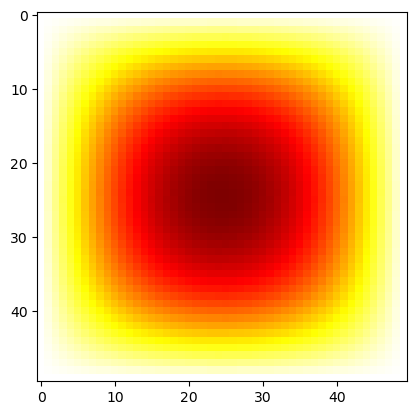

In [153]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import time as time
from IPython.display import HTML
import numpy as np

initial_condition = np.zeros((50, 50))
initial_condition[25, 25] = 100.0  # Point source in the center
initial_condition[0:1, :] = 100  # Top boundary
initial_condition[-1, :] = 100.0  # Bottom boundary
initial_condition[:, 0] = 100.0  # Left boundary
initial_condition[:, -1] = 100.0  # Right boundary

start_time = time.time()
test = solve_diffusion_2d(50, 50, 1.0, 1.0, 0.1, 300, 2.5, initial_condition)
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time for solution: {elapsed_time:.2f} seconds")

fig, ax = plt.subplots()
images = []
for i in range(test.shape[0]):
    img = ax.imshow(test[i], cmap='hot', vmin=0, vmax=100, animated=True)
    images.append([img])
ani = animation.ArtistAnimation(fig, images, interval=50, blit=True, repeat_delay=1000)

HTML(ani.to_jshtml())

In [154]:
""""
Function for solving diffusion system in 2D using finite difference method.

This function has the addition of:
 - Variable alpha values for diffusion coefficient
"""
import numpy as np

def solve_diffusion_2d_vAlpha(nx, ny, dx, dy, dt, nt, alpha, u0):
    """
    Solve the 2D diffusion equation using finite difference method.

    Parameters:
    nx : int
        Number of grid points in x direction.
    ny : int
        Number of grid points in y direction.
    dx : float
        Grid spacing in x direction.
    dy : float
        Grid spacing in y direction.
    dt : float
        Time step size.
    nt : int
        Number of time steps to simulate.
    alpha : 2D array
        Diffusion coefficient.
    u0 : 2D array
        Initial condition for the diffusion equation.

    Returns:
    u : 3D array (t, x, y)
        All solutions from t = 0 to nt time steps.
    """
    # Check stability condition - using max alpha for worst case
    if dt > (dx**2 * dy**2) / (2 * alpha.max() * (dx**2 + dy**2)):
        dt_max = (dx**2 * dy**2) / (2 * alpha.max() * (dx**2 + dy**2))
        alpha_max = (dx**2 * dy**2) / (2 * dt * (dx**2 + dy**2))
        raise ValueError("Time step size dt is too large for stability. Maximum dt: ", dt_max, " or reduce alpha to: ", alpha_max)
    
    u = np.zeros((nt, nx, ny))  # Initialize the solution array
    u[0, :, :] = u0  # Set initial condition
    for n in range(1, nt):
        # Reset boundary conditions at each time step
        u[n, 0, :] = u0[0, :]       # Left boundary
        u[n, -1, :] = u0[-1, :]     # Right boundary
        u[n, :, 0] = u0[:, 0]       # Bottom boundary
        u[n, :, -1] = u0[:, -1]     # Top boundary  
        # Iterate over internal grid points
        for i in range(1, nx-1):    
            for j in range(1, ny-1):
                u[n, i, j] = (u[n-1, i, j] + 
                               alpha[i, j] * dt * ((u[n-1, i+1, j] - 2*u[n-1, i, j] + u[n-1, i-1, j]) / dx**2 +
                                              (u[n-1, i, j+1] - 2*u[n-1, i, j] + u[n-1, i, j-1]) / dy**2))
    return u

Elapsed time for solution: 1.67 seconds


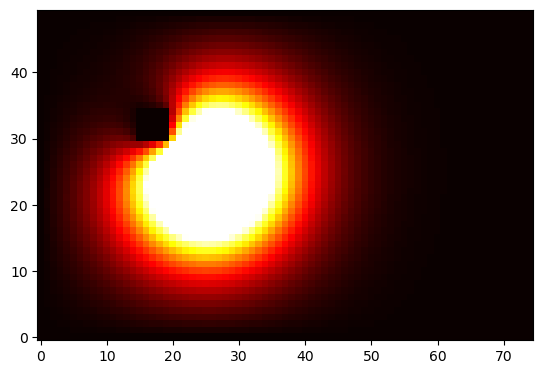

In [155]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import time as time
from IPython.display import HTML
import numpy as np

initial_condition = np.zeros((75, 50))
initial_condition[25, 25] = 1000.0  # Point source in the center
# initial_condition[0:1, :] = 100  # Top boundary
# initial_condition[-1, :] = 100.0  # Bottom boundary
# initial_condition[:, 0] = 100.0  # Left boundary
# initial_condition[:, -1] = 100.0  # Right boundary
# initial_condition[25:-1, 0:25] = 20  # Left boundary

vAlpha = np.ones((75, 50)) * 2.5
vAlpha[25, 25] = 0
vAlpha[15:20, 30:35] = 0

start_time = time.time()
test = solve_diffusion_2d_vAlpha(75, 50, 1.0, 1.0, 0.1, 300, vAlpha, initial_condition)
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time for solution: {elapsed_time:.2f} seconds")

fig, ax = plt.subplots()
images = []
for i in range(test.shape[0]):
    img = ax.imshow(test[i].T, cmap='hot', vmin=0, vmax=100, animated=True, origin='lower')
    images.append([img])
ani = animation.ArtistAnimation(fig, images, interval=50, blit=True, repeat_delay=1000)

HTML(ani.to_jshtml())

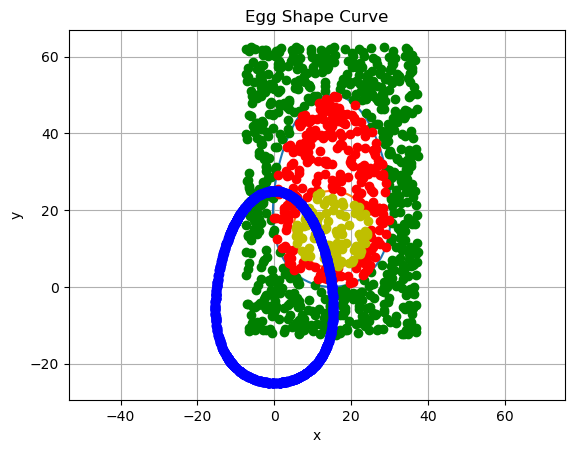

In [156]:
# Egg shape curve
# A parametric equation to generate an egg shape curve
# Reference: Comparison of egg-shape equations using relative curvature measures of nonlinearity, Lian et al., 2024


import numpy as np
import matplotlib.pyplot as plt

def egg_shape(half_width, half_height, t, c1, c2, c3 , x_axis_offset=0, y_axis_offset=0):
    x = (half_width * np.cos(t)) * (1 + c1*np.sin(t) + c2*np.sin(t)**2 + c3*np.sin(t)**3) + x_axis_offset
    y = half_height * np.sin(t) + y_axis_offset
    return x, y

def find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , t, x_axis_offset, y_axis_offset):
    egg_x, egg_y = egg_shape(half_width, half_height, t, c1, c2, c3, 0, 0)
    err = np.atan2(point_y - y_axis_offset, point_x - x_axis_offset) - np.atan2(egg_y, egg_x)
    # print("point: %f, %f - egg: %f, %f - err:, %f - theta: %f, %f"%(point_x, point_y, egg_x, egg_y, err, t, np.atan2(egg_y, egg_x)))
    # print("theta guess: ", np.atan2(point_y - y_axis_offset, point_x - x_axis_offset))
    return err, egg_x, egg_y

def find_theta_of_egg(point_x, point_y, half_width, half_height, c1 , c2 , c3 , x_axis_offset, y_axis_offset):
    # Bisection method t = theta = atan2(y, x)
    a = 0
    b = np.pi 
    err_a = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , a, x_axis_offset, y_axis_offset)[0]
    err_b = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , b, x_axis_offset, y_axis_offset)[0]
    
    if np.sign(err_a)  == np.sign(err_b):
        # print("err_a: ", err_a, "a: ", a, "err_b: ", err_b, "b: ", b)
        b = -np.pi
        err_b = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , b, x_axis_offset, y_axis_offset)[0]
        if np.sign(err_a)  == np.sign(err_b):
                # print("err_a: ", err_a, "a: ", a, "err_b: ", err_b, "b: ", b)
                raise Exception("Bisection method requires a sign change over the interval.")
    
    count = 0
    while True:
        m = (a + b) / 2
        err_m, egg_x, egg_y = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , m, x_axis_offset, y_axis_offset)

        if np.abs(err_m) < 1e-14:
            # print("Converged in ", count, " iterations with error ", err_m)
            return m, egg_x, egg_y
        elif np.sign(err_a) == np.sign(err_m):
            a = m
            err_a = err_m
        else:
            b = m
            err_b = err_m
        
        count += 1
        if count >= 1000:
            print("Error: ", err_m)
            raise Exception("Bisection method did not converge within 1000 iterations.")

def point_within_egg(point_x, point_y, half_width, half_height, c1 , c2 , c3 , x_axis_offset, y_axis_offset):

    # Find a theta of the egg shape that matches the theta of the point
    egg_theta, egg_x, egg_y = find_theta_of_egg(point_x=point_x, point_y=point_y, half_width=half_width, half_height=half_height,
                                                c1=c1, c2=c2, c3=c3, x_axis_offset=x_axis_offset, y_axis_offset=y_axis_offset)
    # Get egg shape X, Y that intersects egg_theta
    # egg_x, egg_y = egg_shape(half_width, half_height, egg_theta, c1=c1, c2=c2, c3=c3, x_axis_offset=0, y_axis_offset=0)
    # egg_x, egg_y = egg_shape(half_width, half_height, egg_theta, c1, c2, c3, 0, 0)
    # print("theta point: ", np.atan2(point_y - y_axis_offset, point_x - x_axis_offset), ", theta of egg_cor: ", np.atan2(egg_y, egg_x), ", theta: ", egg_theta)
    # print("egg x,y: ", egg_x, ", ", egg_y, " theta: ", np.atan2(egg_y, egg_x), " theta cor: ", egg_theta)

    # Return if point is within egg shape
    return ((point_x - x_axis_offset)**2 + (point_y - y_axis_offset)**2) <= (egg_x**2 + egg_y**2), egg_x, egg_y


def yoke_shape(x_axis_offset, y_axis_offset, a, b, t):
    x = x_axis_offset + a*np.cos(t)
    y = y_axis_offset + b*np.sin(t)
    return x, y

t = np.linspace(0, 2*np.pi, 100)
# Egg parameters
width = 15
height = 25
c1 = -0.2
c2 = 0.1
c3 = 0.0
x_shift = width
y_shift = height
# Yoke parameters
a = 10
b = 10
x_shift_yoke = x_shift
y_shift_yoke = y_shift - 10

x, y = egg_shape(width, height, t, c1=c1, c2=c2, c3=c3, x_axis_offset=x_shift, y_axis_offset=y_shift)
x_yoke, y_yoke = yoke_shape(x_shift_yoke, y_shift_yoke, a, b, t)

x_test = np.random.rand(1000) * width * 3 - 0.5 * width
y_test = np.random.rand(1000) * height * 3 - 0.5 * height

# x_test = np.ones(1) * 5
# y_test = np.ones(1) * 5

point_in_egg = np.zeros_like(x_test, dtype=bool)
point_in_york = np.zeros_like(x_test, dtype=bool)
x_egg_chk = np.zeros_like(x_test)
y_egg_chk = np.zeros_like(x_test)
for i in range(len(x_test)):
    point_in_egg[i], x_egg_chk[i], y_egg_chk[i] = point_within_egg(x_test[i], y_test[i], width, height, 
                                       c1 , c2 , c3 , 
                                       x_shift, y_shift)
    # Need to fix this for an ellipse not circle
    point_in_york[i] = ((x_test[i] - x_shift_yoke)**2 + (y_test[i] - y_shift_yoke)**2)**0.5 <= (a)
    
plt.plot(x, y)
plt.plot(x_yoke, y_yoke)
plt.plot(x_test[np.where(np.invert(point_in_egg))], y_test[np.where(np.invert(point_in_egg))], 'go')  # Plot test points
plt.plot(x_test[np.where(point_in_egg != point_in_york)], y_test[np.where(point_in_egg != point_in_york)], 'ro')  # Plot test points
plt.plot(x_test[np.where(point_in_york)], y_test[np.where(point_in_york)], 'yo')  # Plot test points
plt.plot(x_egg_chk, y_egg_chk, 'bo')  # Plot test points
plt.title('Egg Shape Curve')
plt.xlabel('x')
plt.ylabel('y')
plt.axis('equal')
plt.grid()
plt.show()


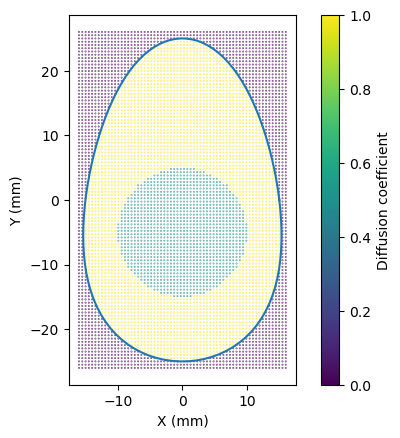

In [208]:
import math
import numpy as np

def round_up_to_nearest_odd(value):
    round_up_value = math.ceil(value)
    if round_up_value % 2 == 0:
        return int(round_up_value +1)
    else:
        return int(round_up_value)
    
# Make diffusion grid

# Model definition
egg_width = 30      # mm
egg_height = 50     # mm
egg_c1 = -0.2       # Shape parameter 1st order
egg_c2 = 0.1        # Shape parameter 2nd order
egg_c3 = 0.0        # Shape parameter 3rd order
white_alpha = 1     # Egg white coefficient of diffusion
yoke_width = 20     # mm
yoke_height = yoke_width    # mm, assume round for now - can implement ellipse later if needed
yoke_center = -5    # mm, height from base off egg
yoke_alpha  = 0.5   # Egg yoke coefficient of diffusion

# Mesh definition
dx = 0.5     # mm per node
dy = dx
# # mesh_width: odd value puts line of node at line of symmetry, +1 is for boundary conditions at 0 & n
# mesh_width = round_up_to_nearest_odd(egg_width / dx + 1)   
# mesh_height = round_up_to_nearest_odd(egg_height / dy + 1)

mesh_X_mm = np.linspace(-egg_width/2 - 1, egg_width/2 + 1, int(np.ceil((egg_width + 2)/dx)))
mesh_Y_mm = np.linspace(-egg_height/2 - 1, egg_height/2 + 1, int(np.ceil((egg_height + 2)/dx)))

# mesh_X_mm = np.linspace(-egg_width/2 - 1, egg_width/2 + 1, (egg_width + 2)*dx)
# mesh_Y_mm = np.linspace(-egg_height/2 - 1, egg_height/2 + 1, (egg_width + 2)*dy)

# Diffusion grid
X, Y = np.meshgrid(mesh_X_mm, mesh_Y_mm)
alpha_grid = np.zeros_like(X)

for y in range(np.size(alpha_grid,0 )):
    for x in range(np.size(alpha_grid, 1)):
        # Check if point in yoke
        point_in_yoke = (X[y, x]**2 + (Y[y, x] - yoke_center)**2) <= (yoke_width/2)**2
        if point_in_yoke:
            alpha_grid[y, x] = yoke_alpha
        else:
            # Check if point in white
            point_in_egg, e1, e2 = point_within_egg(X[y, x], Y[y, x], egg_width/2, egg_height/2,
                                                    egg_c1, egg_c2, egg_c3, 
                                                    0, 0)
            if point_in_egg:
                alpha_grid[y, x] = white_alpha

x, y = egg_shape(egg_width/2, egg_height/2,
                 np.linspace(0, 2*np.pi, 100),
                 egg_c1, egg_c2, egg_c3,
                 0, 0)

fig, ax = plt.subplots()
ax.set_aspect('equal')
scatter = ax.scatter(X, Y, c=alpha_grid, cmap='viridis', s=0.1)
fig.colorbar(scatter, ax=ax, label='Diffusion coefficient')
plt.plot(x, y)
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.show()



Elapsed time for solution: 3.10 seconds


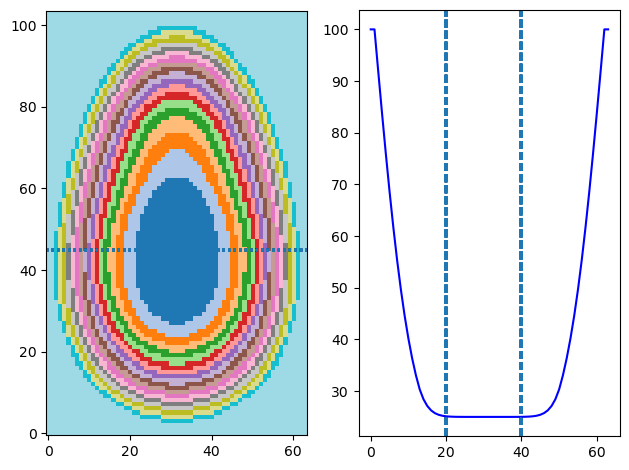

In [234]:
# Test alpha_grid

import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.cm as cm
import time as time
from IPython.display import HTML
import numpy as np

initial_condition = np.ones_like(alpha_grid) * 25   # All start at 25 degrees
initial_condition[np.where(alpha_grid == 0)] = 100

start_time = time.time()
test = solve_diffusion_2d_vAlpha(np.size(alpha_grid, 1), np.size(alpha_grid, 0), 
                                 dx, dy, 0.0625, 300, alpha_grid.T, initial_condition.T)
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time for solution: {elapsed_time:.2f} seconds")

fig, (ax1, ax2) = plt.subplots(1, 2)
images = []

for i in range(100):
    ax1.axhline(45, linestyle=':', label='test')
    img = ax1.imshow(test[i*3].T, cmap='tab20', vmin=25, vmax=100, animated=True, origin='lower')  

    y_data = np.zeros(np.size(test,1))
    x_data = np.zeros_like(y_data)
    for j in range(np.size(test,1)):
        x_data[j] = j
        y_data[j] = test[i,j,45]
    line_art, = ax2.plot(x_data, y_data, 'b-', animated=True)
    ax2.axvline(20, linestyle='--', animated=True)
    ax2.axvline(40, linestyle='--', animated=True)

    images.append([img, line_art])

plt.tight_layout()
ani = animation.ArtistAnimation(fig, images, interval=50, blit=True, repeat_delay=1000)

HTML(ani.to_jshtml())